In [1]:
import numpy as np
import pandas as pd
import os
import tensorflow as tf
import matplotlib.pyplot as plt
import sklearn
from random import randrange
import cv2

In [2]:
classes = {'0': 0,
         '1': 1,
         '2': 2,
         '3': 3,
         '4': 4,
         '5': 5,
         '6': 6,
         '7': 7,
         '8': 8,
         '9': 9,
         '10': 10,
         '11': 11,
         '12': 12,
         '13': 13,
         '14': 14,
         '15': 15,
         '16': 16,
         }
image_size = 256
target_size = (256, 256)
batch_size = 32

In [3]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [4]:
training_img_list = pd.DataFrame(columns=['filename','class'])
pathToTrainData="/content/gdrive/My Drive/GL_Assignments/Computer Vision/Data/17flowers- train/jpg"

for dirname, _, filenames in os.walk(pathToTrainData):
    for filename in filenames:
        path = os.path.join(dirname, filename)
        class_label = dirname.split('/')[-1]
        training_img_list = training_img_list.append({'filename':path , 'class':class_label}, ignore_index = True)

In [5]:
#training_img_list = sklearn.utils.shuffle(training_img_list)
training_img_list.head(10)

,filename,class
0,/content/gdrive/My Drive/GL_Assignments/Comput...,8
1,/content/gdrive/My Drive/GL_Assignments/Comput...,8
2,/content/gdrive/My Drive/GL_Assignments/Comput...,8
3,/content/gdrive/My Drive/GL_Assignments/Comput...,8
4,/content/gdrive/My Drive/GL_Assignments/Comput...,8
5,/content/gdrive/My Drive/GL_Assignments/Comput...,8
6,/content/gdrive/My Drive/GL_Assignments/Comput...,8
7,/content/gdrive/My Drive/GL_Assignments/Comput...,8
8,/content/gdrive/My Drive/GL_Assignments/Comput...,8
9,/content/gdrive/My Drive/GL_Assignments/Comput...,8


In [6]:
idg_sample = tf.keras.preprocessing.image.ImageDataGenerator(
                    rescale=1./255,
                    horizontal_flip=True,
                    vertical_flip=True
                    )
sample_data = idg_sample.flow_from_directory("/content/gdrive/My Drive/GL_Assignments/Computer Vision/Data/17flowers- train/jpg",
                                                    target_size=target_size,
                                                    #subset='training',
                                                    class_mode='categorical',
                                                    batch_size=64,
                                                    shuffle=True,
                                                    seed=1,
                                                    classes = classes
                                                )

Found 1375 images belonging to 17 classes.


In [ ]:
from mpl_toolkits.axes_grid1 import ImageGrid

def show_unique_grid(image_gen, figsize=(10,10)):
    dist_classes = [image_gen.classes.tolist().index(x) for x in set(image_gen.classes.tolist())]
    title_list = [image_gen.classes.tolist()[i] for i in dist_classes]
    im_set = [image_gen[i//32][0][i%32] for i in dist_classes]
    fig = plt.figure(None, (10,10),frameon=False)
    grid = ImageGrid(fig, 111, 
                     nrows_ncols=(3, 4),  
                     axes_pad=0.2, 
                     share_all=True,
                     )
    for i in range(17):
        ax = grid[i]
        ax.imshow(im_set[i],cmap='Greys_r')
        ax.set_title(title_list[i])
        ax.axis('off')

**Displaying Images**

Taking 1 Image for demonstration

Using skimage module to display a RGB image

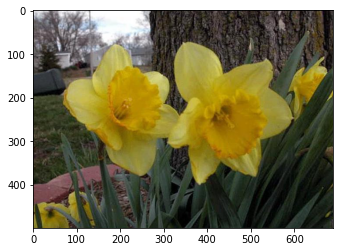

In [ ]:
import skimage
from skimage.viewer import ImageViewer
filename = "/content/gdrive/My Drive/GL_Assignments/Computer Vision/Data/17flowers- train/jpg/0/image_0001.jpg"
image = skimage.io.imread(fname=filename)
plt.imshow(image)
plt.show()

Using OpenCV to display a RGB image

width=689, height=500, depth=3


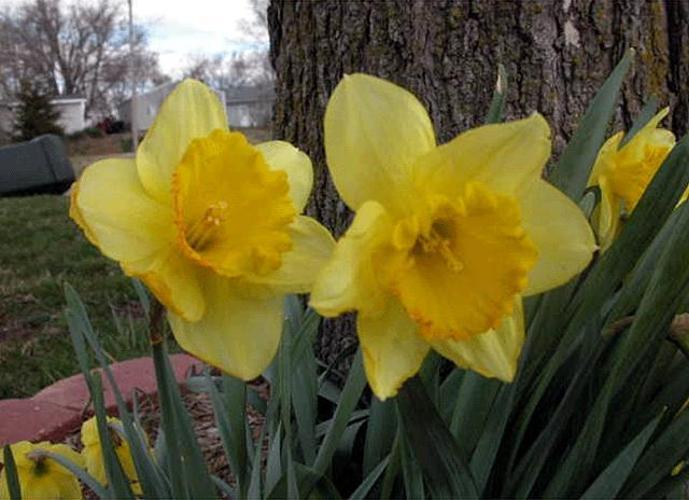

In [ ]:
import imutils
import cv2
from google.colab.patches import cv2_imshow

image = cv2.imread("/content/gdrive/My Drive/GL_Assignments/Computer Vision/Data/17flowers- train/jpg/0/image_0001.jpg")
(h, w, d) = image.shape
print("width={}, height={}, depth={}".format(w, h, d))
cv2_imshow(image)

Applying a Gaussian blur with a 11x11 kernel to the image to smooth it

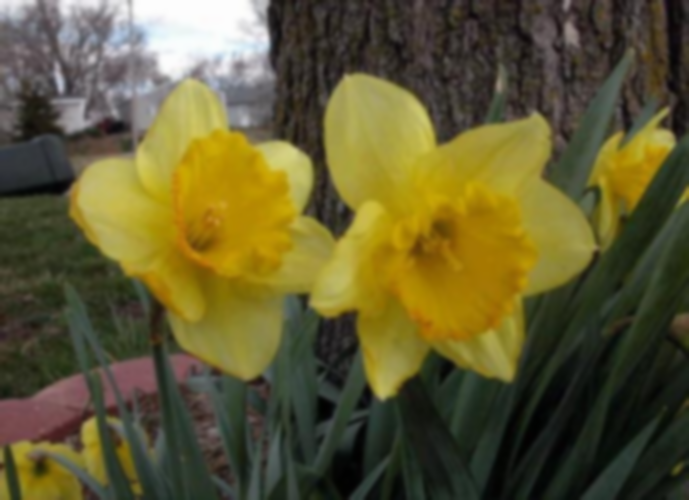

In [ ]:
blurred = cv2.GaussianBlur(image, (11, 11), 0)
cv2_imshow(blurred)

**Edge Detection**

Applying edge detection to find the outlines of objects in the image

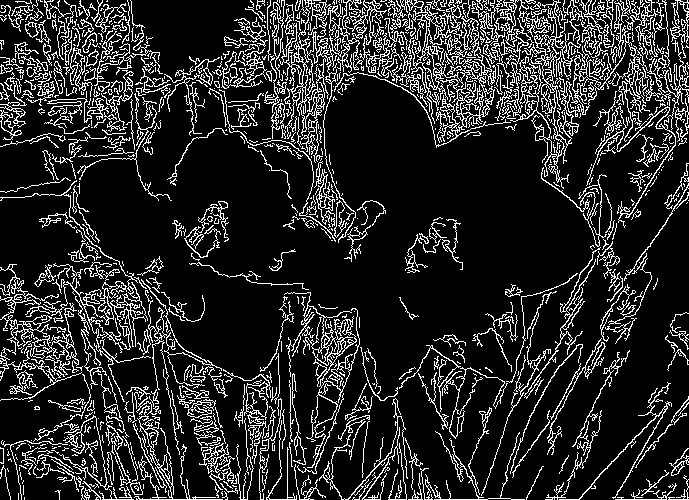

In [ ]:
edged = cv2.Canny(image, 30, 150)
cv2_imshow(edged)

**Thresholding and Contour Detection**

Gray scaling

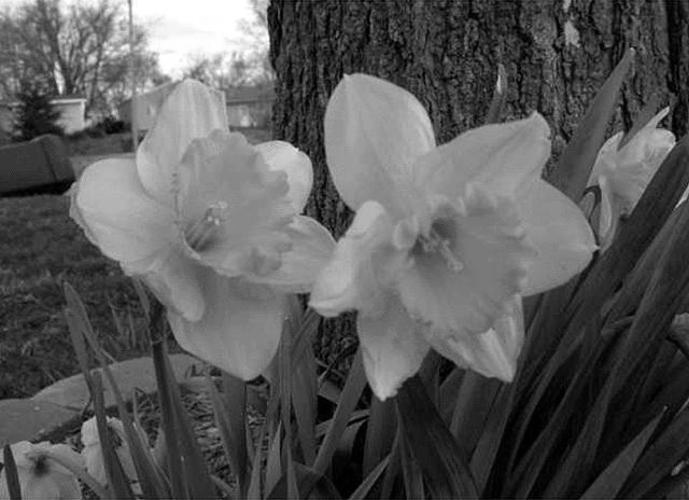

In [ ]:
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

Thresholding the image by setting all pixel values less than 225
to 255 (white; foreground) and all pixel values >= 225 to 255
(black; background), thereby segmenting the image.

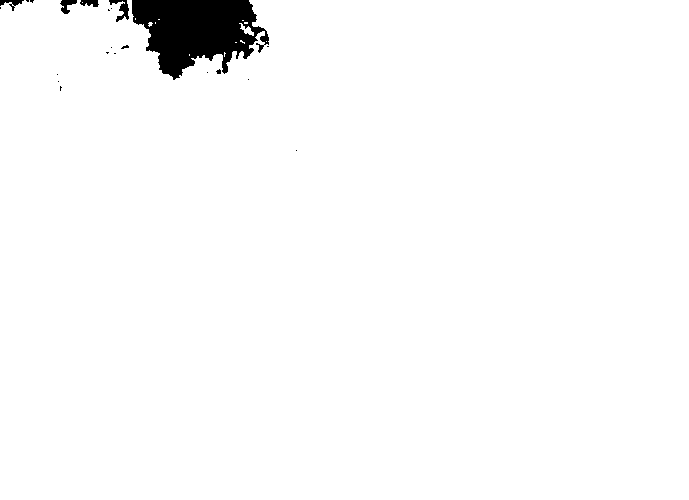

In [ ]:
thresh = cv2.threshold(gray, 225, 255, cv2.THRESH_BINARY_INV)[1]
cv2_imshow(thresh)

In [ ]:
Contour Detection

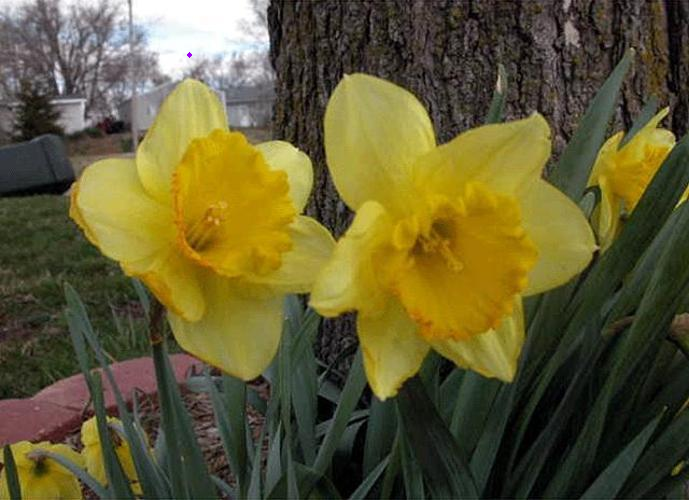

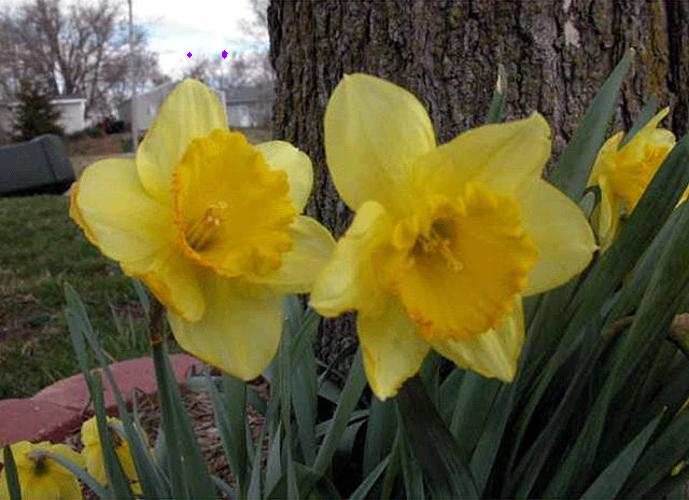

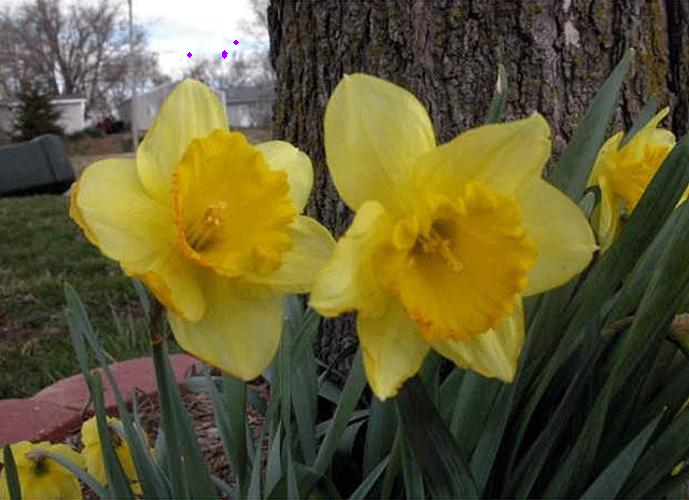

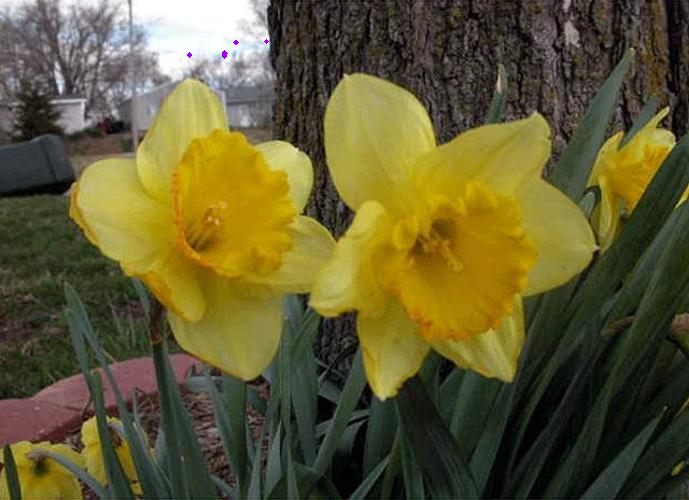

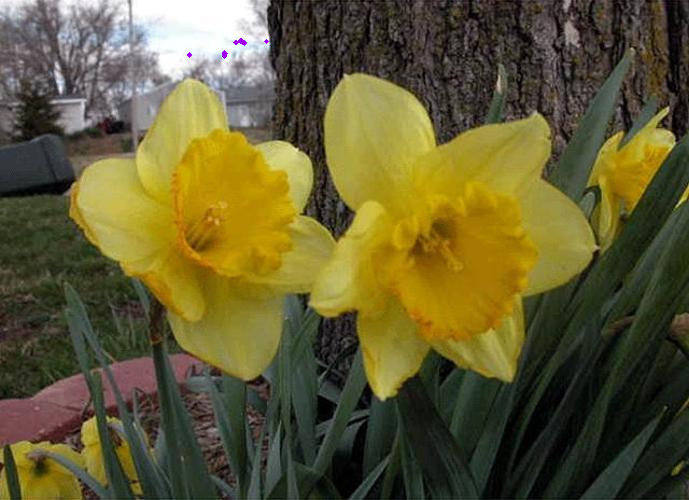

...

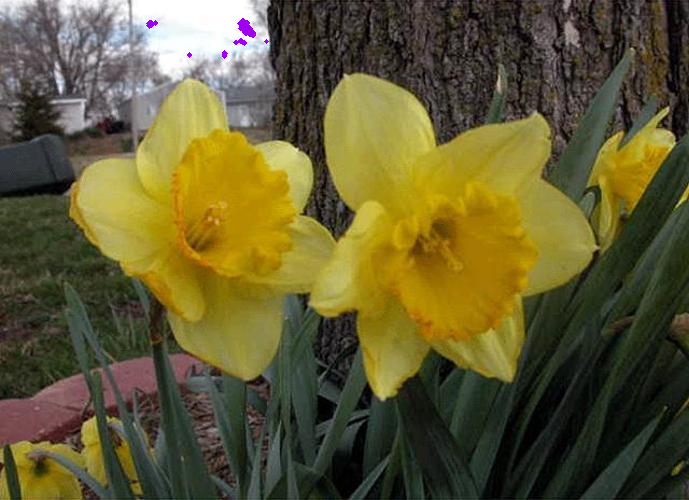

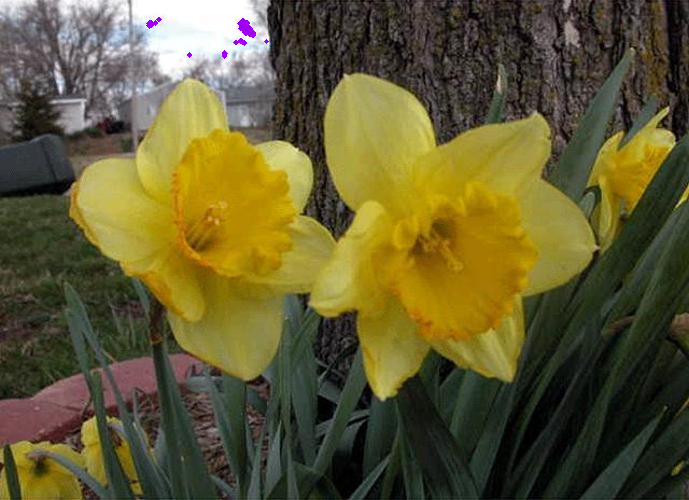

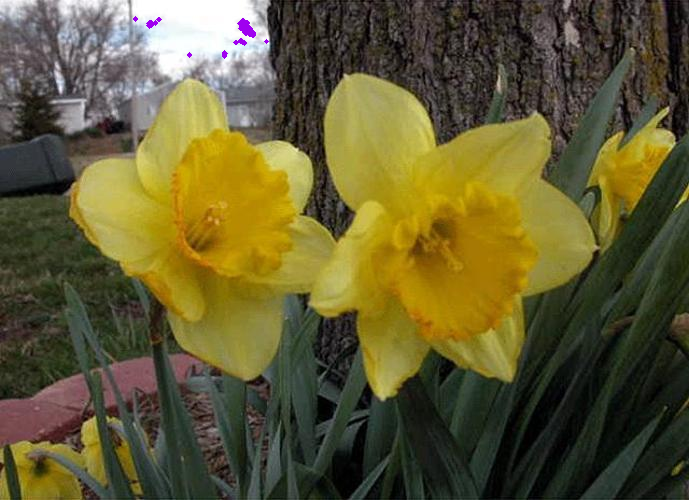

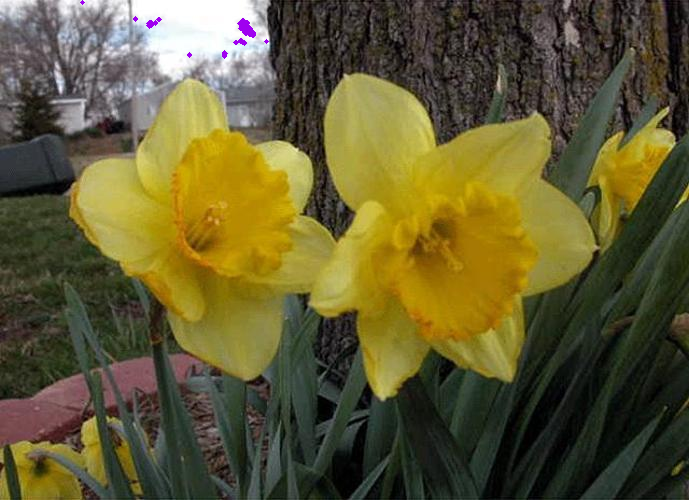

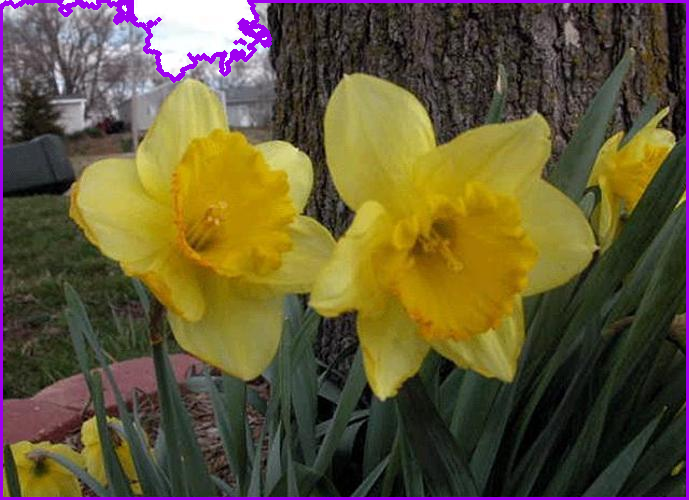

In [ ]:
# find contours (i.e., outlines) of the foreground objects in the
# thresholded image
cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL,
	cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)
output = image.copy()
# loop over the contours
for c in cnts:
	# draw each contour on the output image with a 3px thick purple
	# outline, then display the output contours one at a time
	cv2.drawContours(output, [c], -1, (240, 0, 159), 3)
	cv2_imshow(output)

**Embossing**

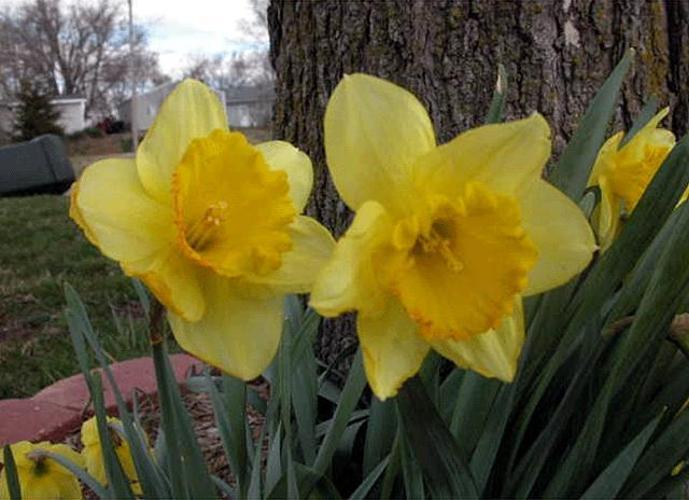

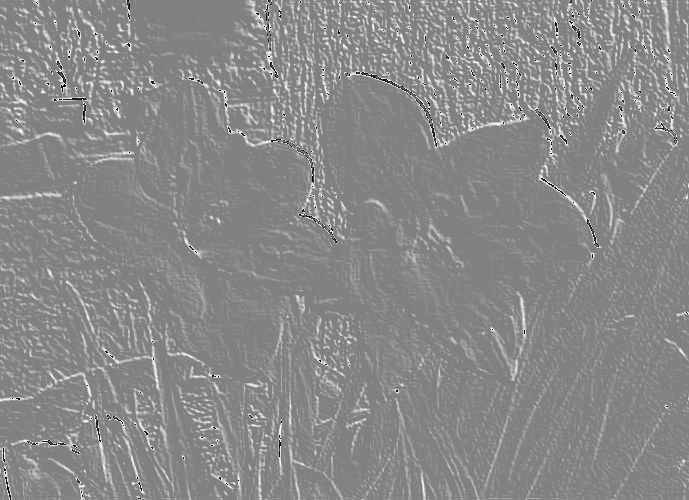

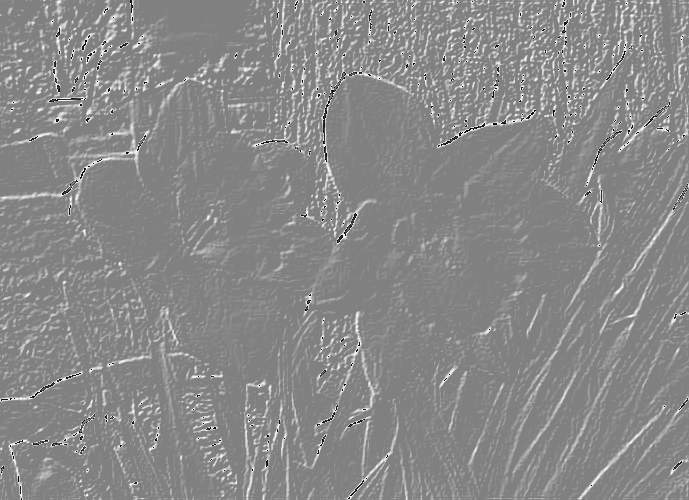

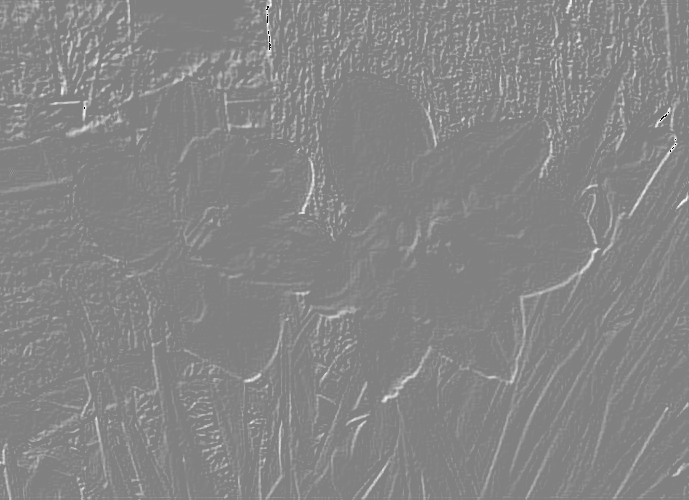

In [ ]:
kernel_emboss_1 = np.array([[0,-1,-1],
[1,0,-1],
[1,1,0]])
kernel_emboss_2 = np.array([[-1,-1,0],
[-1,0,1],
[0,1,1]])
kernel_emboss_3 = np.array([[1,0,0],
[0,0,0],
[0,0,-1]])

# applying the kernels to the grayscale image and adding the offset
output_1 = cv2.filter2D(gray, -1, kernel_emboss_1) + 128
output_2 = cv2.filter2D(gray, -1, kernel_emboss_2) + 128
output_3 = cv2.filter2D(gray, -1, kernel_emboss_3) + 128

cv2_imshow(image)
cv2_imshow(output_1)
cv2_imshow(output_2)
cv2_imshow(output_3)

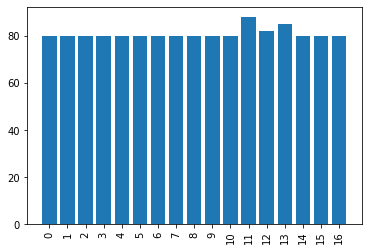

In [ ]:
unique, counts = np.unique(sample_data.classes, return_counts=True)
dict1 = dict(zip(sample_data.class_indices, counts))

keys = dict1.keys()
values = dict1.values()

plt.xticks(rotation='vertical')
bar = plt.bar(keys, values)

Image Classification using CNN

In [ ]:
def get_model():
    model = tf.keras.models.Sequential() #1
    model.add(tf.keras.layers.InputLayer(input_shape=(image_size,image_size,3,))) #2
    model.add(tf.keras.layers.Conv2D(64, kernel_size=(3,3), activation='relu')) #3
    model.add(tf.keras.layers.Conv2D(64, kernel_size=(3,3), activation='relu')) #4
    model.add(tf.keras.layers.MaxPool2D(pool_size = (2,2))) #5
    model.add(tf.keras.layers.BatchNormalization()) #6
    model.add(tf.keras.layers.Conv2D(64, kernel_size=(3,3), strides = (1,1), activation='relu')) #7
    model.add(tf.keras.layers.MaxPool2D(pool_size = (2,2))) #8
    model.add(tf.keras.layers.BatchNormalization()) #9
    model.add(tf.keras.layers.Conv2D(128, kernel_size=(3,3), strides = (1,1), activation='relu')) #10
    model.add(tf.keras.layers.MaxPool2D(pool_size = (2,2))) #11
    model.add(tf.keras.layers.BatchNormalization()) #12
    model.add(tf.keras.layers.Conv2D(128, kernel_size=(3,3), strides = (1,1), activation='relu')) #13
    model.add(tf.keras.layers.MaxPool2D(pool_size = (2,2))) #14
    model.add(tf.keras.layers.GlobalMaxPool2D()) #15
    model.add(tf.keras.layers.Flatten()) #16 
    model.add(tf.keras.layers.Dense(128, activation='relu')) #17
    model.add(tf.keras.layers.Dropout(0.2)) #18
    model.add(tf.keras.layers.Dense(64, activation='relu')) #19
    model.add(tf.keras.layers.BatchNormalization()) #20
    model.add(tf.keras.layers.Dense(17, activation='softmax')) #21
    
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    #model.compile(optimizer='adam', loss='squared_hinge', metrics=['accuracy'])
    return model

In [ ]:
get_model().summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 254, 254, 64)      1792      
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 252, 252, 64)      36928     
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 126, 126, 64)      0         
_________________________________________________________________
batch_normalization_4 (Batch (None, 126, 126, 64)      256       
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 124, 124, 64)      36928     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 62, 62, 64)        0         
_________________________________________________________________
batch_normalization_5 (Batch (None, 62, 62, 64)       

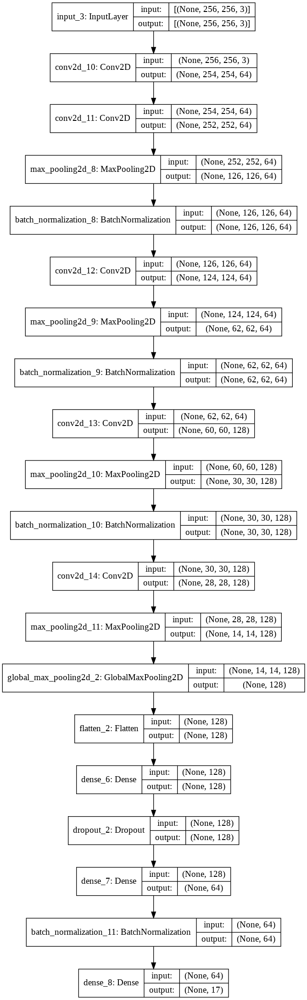

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(get_model(), show_shapes=True, show_layer_names=True)

Overfitting with entire dataset to make sure network design is correct

In [ ]:
model = get_model()
model.fit(sample_data,
          epochs=30,
          verbose = 1
          )

Epoch 1/30
22/22 [==============================] - 15s 637ms/step - loss: 2.8027 - accuracy: 0.1556
Epoch 2/30
22/22 [==============================] - 14s 634ms/step - loss: 2.1908 - accuracy: 0.2727
Epoch 3/30
22/22 [==============================] - 15s 644ms/step - loss: 1.8148 - accuracy: 0.4080
Epoch 4/30
22/22 [==============================] - 15s 646ms/step - loss: 1.5695 - accuracy: 0.4916
Epoch 5/30
22/22 [==============================] - 15s 642ms/step - loss: 1.3726 - accuracy: 0.5753
Epoch 6/30
22/22 [==============================] - 14s 638ms/step - loss: 1.2904 - accuracy: 0.5833
Epoch 7/30
22/22 [==============================] - 15s 646ms/step - loss: 1.2214 - accuracy: 0.6145
Epoch 8/30
22/22 [==============================] - 15s 643ms/step - loss: 1.0485 - accuracy: 0.6785
Epoch 9/30
22/22 [==============================] - 14s 640ms/step - loss: 0.8988 - accuracy: 0.7215
Epoch 10/30
22/22 [==============================] - 14s 639ms/step - loss: 0.8519 - accura

In [ ]:
#model.predict(predict_data)
predictions = model.predict(predict_data, steps=predict_data.samples)
y_pred = []
for i in range(0, predictions.shape[0]):
  y_class = predictions[i, :].argmax(axis=-1)
  y_pred.append(y_class)
  print(y_class)

10


Generalizing model with K fold Cross Validation

In [ ]:
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score


kfold = KFold(n_splits=5, shuffle=True)
fold = 1
accuracies = []
rand_num = randrange(100000)
for train, test in kfold.split(training_img_list):
    model = get_model()
    idg = tf.keras.preprocessing.image.ImageDataGenerator(
            rescale=1./255,
            horizontal_flip=True,
            vertical_flip=True,
            validation_split=0.4
           )
    #idg1 = tf.keras.preprocessing.image.ImageDataGenerator(
        #featurewise_center=True,
        #featurewise_std_normalization=True,
        rescale=1./255,
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        horizontal_flip=True,
        vertical_flip=True,
        zca_whitening=True,
        shear_range=0.2,
        zoom_range=0.2,
        brightness_range=(0.2,0.8),
        validation_split=0.2
          )
    #Actual Training data for the model
    train_gen = idg.flow_from_dataframe(training_img_list.iloc[train,:],
                                        x_col="filename",
                                        y_col="class",
                                        subset='training',
                                        target_size=target_size,
                                        class_mode='categorical',
                                        batch_size=32,
                                        seed=1,
                                        shuffle=True,
                                        classes=classes
                                        )
    #Validation set for training the model, so the checkpoint can track the best model with max val accuracy
    val_gen   = idg.flow_from_dataframe(training_img_list.iloc[train,:],
                                        x_col="filename",
                                        y_col="class",
                                        subset='validation',
                                        target_size=target_size,
                                        class_mode='categorical',
                                        batch_size=32,
                                        seed=1,
                                        classes=classes
                                        )
    

    model_name = 'plant_classifier_'+str(rand_num)+'_fold_no_'+str(fold)+'.h5'
    checkpoint = tf.keras.callbacks.ModelCheckpoint(model_name,
                                                    save_best_only=True, 
                                                    monitor='val_accuracy', 
                                                    mode='max', 
                                                    verbose = 1
                                                    )
    es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, mode='min', min_delta=0.0001)
    history = model.fit(train_gen,
                        epochs=20,
                        validation_data=val_gen,
                        callbacks = [checkpoint, es],
                        verbose = 1
                        )
    
    # Testing for the fold
    idg2 = tf.keras.preprocessing.image.ImageDataGenerator(
                        rescale=1./255,
                        rotation_range=20,
                        width_shift_range=0.2,
                        height_shift_range=0.2,
                        horizontal_flip=True,
                        vertical_flip=True
                       )
    test_gen = idg2.flow_from_dataframe(training_img_list.iloc[test,:],
                                        x_col="filename",
                                        y_col="class",
                                        target_size=target_size,
                                        class_mode= 'categorical',
                                        batch_size=32,
                                        seed=1,
                                        classes=classes,
                                        shuffle=False
                                        )
    model.load_weights('./'+model_name)
    predictions = model.predict(test_gen, steps=test_gen.samples)
    y_pred = []
    for i in range(0, predictions.shape[0]):
      y_class = predictions[i, :].argmax(axis=-1)
      y_pred.append(y_class)
    accuracies.append(accuracy_score(test_gen.classes, y_pred))
    print('Accuracy for the fold ',fold, ': ', accuracies[fold-1])
    fold += 1

/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:337: UserWarning: This ImageDataGenerator specifies `zca_whitening`, which overrides setting of `featurewise_center`.
  warnings.warn('This ImageDataGenerator specifies '


Found 880 validated image filenames belonging to 17 classes.
Found 220 validated image filenames belonging to 17 classes.


/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:720: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '
/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:739: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '


Epoch 1/20
28/28 [==============================] - 30s 1s/step - loss: 2.9100 - accuracy: 0.1352 - val_loss: 2.7895 - val_accuracy: 0.0000e+00

Epoch 00001: val_accuracy improved from -inf to 0.00000, saving model to plant_classifier_95151_fold_no_1.h5
Epoch 2/20
28/28 [==============================] - 28s 990ms/step - loss: 2.4306 - accuracy: 0.2341 - val_loss: 2.9430 - val_accuracy: 0.0000e+00

Epoch 00002: val_accuracy did not improve from 0.00000
Epoch 3/20
28/28 [==============================] - 28s 995ms/step - loss: 2.0844 - accuracy: 0.3080 - val_loss: 2.9872 - val_accuracy: 0.0000e+00

Epoch 00003: val_accuracy did not improve from 0.00000
Epoch 4/20
28/28 [==============================] - 28s 998ms/step - loss: 2.0992 - accuracy: 0.3148 - val_loss: 3.2014 - val_accuracy: 0.0000e+00

Epoch 00004: val_accuracy did not improve from 0.00000
Epoch 5/20
28/28 [==============================] - 28s 994ms/step - loss: 1.8829 - accuracy: 0.3693 - val_loss: 3.5815 - val_accuracy: 0

/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:337: UserWarning: This ImageDataGenerator specifies `zca_whitening`, which overrides setting of `featurewise_center`.
  warnings.warn('This ImageDataGenerator specifies '


Found 880 validated image filenames belonging to 17 classes.
Found 220 validated image filenames belonging to 17 classes.


/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:720: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '
/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:739: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '


Epoch 1/20
28/28 [==============================] - 30s 1s/step - loss: 2.8370 - accuracy: 0.1261 - val_loss: 3.0007 - val_accuracy: 0.0000e+00

Epoch 00001: val_accuracy improved from -inf to 0.00000, saving model to plant_classifier_95151_fold_no_2.h5
Epoch 2/20
28/28 [==============================] - 28s 987ms/step - loss: 2.3252 - accuracy: 0.2398 - val_loss: 3.1461 - val_accuracy: 0.0000e+00

Epoch 00002: val_accuracy did not improve from 0.00000
Epoch 3/20
28/28 [==============================] - 28s 998ms/step - loss: 2.0784 - accuracy: 0.3057 - val_loss: 3.3654 - val_accuracy: 0.0000e+00

Epoch 00003: val_accuracy did not improve from 0.00000
Epoch 4/20
28/28 [==============================] - 28s 986ms/step - loss: 2.0263 - accuracy: 0.3125 - val_loss: 3.5562 - val_accuracy: 0.0000e+00

Epoch 00004: val_accuracy did not improve from 0.00000
Epoch 5/20
28/28 [==============================] - 28s 994ms/step - loss: 1.8114 - accuracy: 0.3875 - val_loss: 3.8904 - val_accuracy: 0

/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:337: UserWarning: This ImageDataGenerator specifies `zca_whitening`, which overrides setting of `featurewise_center`.
  warnings.warn('This ImageDataGenerator specifies '


Found 880 validated image filenames belonging to 17 classes.
Found 220 validated image filenames belonging to 17 classes.


/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:720: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '
/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:739: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '


Epoch 1/20
28/28 [==============================] - 30s 1s/step - loss: 2.9485 - accuracy: 0.1261 - val_loss: 2.9690 - val_accuracy: 0.0000e+00

Epoch 00001: val_accuracy improved from -inf to 0.00000, saving model to plant_classifier_95151_fold_no_3.h5
Epoch 2/20
28/28 [==============================] - 28s 996ms/step - loss: 2.3917 - accuracy: 0.2250 - val_loss: 3.0885 - val_accuracy: 0.0000e+00

Epoch 00002: val_accuracy did not improve from 0.00000
Epoch 3/20
28/28 [==============================] - 28s 996ms/step - loss: 2.1301 - accuracy: 0.3034 - val_loss: 3.1572 - val_accuracy: 0.0000e+00

Epoch 00003: val_accuracy did not improve from 0.00000
Epoch 4/20
28/28 [==============================] - 28s 986ms/step - loss: 1.9094 - accuracy: 0.3625 - val_loss: 3.3751 - val_accuracy: 0.0000e+00

Epoch 00004: val_accuracy did not improve from 0.00000
Epoch 5/20
 5/28 [====>.........................] - ETA: 18s - loss: 1.8102 - accuracy: 0.3625

KeyboardInterrupt: ignored

In [ ]:
print('5 fold accuracies= ', accuracies)
print('5 fold accuracy = ', np.mean(accuracies))

5 fold accuracies=  [0.09090909090909091, 0.06181818181818182, 0.11272727272727273, 0.09090909090909091, 0.15272727272727274]
5 fold accuracy =  0.10181818181818184


Predicting Image

In [ ]:
predict_img_list = pd.DataFrame(columns=['filename', 'class'])
pathToPredictData="/content/gdrive/My Drive/GL_Assignments/Computer Vision/Data/Flower-Prediction/"

for dirname, _, filenames in os.walk(pathToPredictData):
    for filename in filenames:
        path = os.path.join(dirname, filename)
        #print(path)
        class_label = dirname.split('/')[-1]
        #print(class_label)
        predict_img_list = predict_img_list.append({'filename':path , 'class':class_label}, ignore_index = True)

predict_idg_sample = tf.keras.preprocessing.image.ImageDataGenerator(
                    rescale=1./255,
                    horizontal_flip=True,
                    vertical_flip=True
                    )
predict_data = predict_idg_sample.flow_from_directory("/content/gdrive/My Drive/GL_Assignments/Computer Vision/Data/Flower-Prediction",
                                                    target_size=target_size,
                                                    #subset='training',
                                                    class_mode=None,
                                                    batch_size=64,
                                                    shuffle=False,
                                                    seed=1,
                                                    classes = class_label
                                                )

Found 1 images belonging to 1 classes.


In [ ]:
#model.predict(predict_data)
predictions = model.predict(predict_data, steps=predict_data.samples)
y_pred = []
for i in range(0, predictions.shape[0]):
  y_class = predictions[i, :].argmax(axis=-1)
  y_pred.append(y_class)
  print(y_class)

2


The poor validation accuracy and prediction is because of lack of data.
Let's try Transferred Learning

**Transferred Learning**


In [7]:
import tensorflow.keras
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tensorflow.keras.applications import imagenet_utils
from tensorflow.keras.layers import Dense,GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.applications.mobilenet import preprocess_input
import numpy as np
from IPython.display import Image
from tensorflow.keras.optimizers import Adam

In [8]:
base_model=MobileNet(weights='imagenet',include_top=False) #imports the mobilenet model and discards the last 1000 neuron layer.

x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dense(1024,activation='relu')(x) #we add dense layers so that the model can learn more complex functions and classify for better results.
x=Dense(1024,activation='relu')(x) #dense layer 2
x=Dense(512,activation='relu')(x) #dense layer 3
preds=Dense(17,activation='softmax')(x) #final layer with softmax activation

model=Model(inputs=base_model.input,outputs=preds)

# model.add(tf.keras.layers.Dense(128, activation='relu')) #17
#     model.add(tf.keras.layers.Dropout(0.2)) #18
#     model.add(tf.keras.layers.Dense(64, activation='relu')) #19
#     model.add(tf.keras.layers.BatchNormalization()) #20
#     model.add(tf.keras.layers.Dense(17, activation='softmax')) #21

17227776/17225924 [==============================] - 0s 0us/step


In [20]:
!pip install git+https://github.com/qubvel/segmentation_models

  Cloning https://github.com/qubvel/segmentation_models to /tmp/pip-req-build-w2geuvmy
  Running command git clone -q https://github.com/qubvel/segmentation_models /tmp/pip-req-build-w2geuvmy
  Running command git submodule update --init --recursive -q
     |████████████████████████████████| 50 kB 4.5 MB/s 
  Created wheel for segmentation-models: filename=segmentation_models-1.0.1-py3-none-any.whl size=33809 sha256=c0eb2a76e6fdf1f3f363cbe9ae964de3b228e77987ade4f78174939609ae6a73
  Stored in directory: /tmp/pip-ephem-wheel-cache-5_laqpzu/wheels/02/cd/18/61c0bbb8766acfec68f9d20618886b7b38dfeeb95865b6ba00
Successfully built segmentation-models


In [21]:
#Import libraries
import segmentation_models
segmentation_models.set_framework('tf.keras')
from segmentation_models import Unet

Segmentation Models: using `keras` framework.


In [22]:
base_model = Unet(backbone_name='inceptionv3', encoder_weights='imagenet')
x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dense(1024,activation='relu')(x) #we add dense layers so that the model can learn more complex functions and classify for better results.
x=Dense(1024,activation='relu')(x) #dense layer 2
x=Dense(512,activation='relu')(x) #dense layer 3
preds=Dense(17,activation='softmax')(x) #final layer with softmax activation

model=Model(inputs=base_model.input,outputs=preds)

87916544/87910968 [==============================] - 2s 0us/step


In [9]:
model.compile(optimizer='Adam',loss='categorical_crossentropy',metrics=['accuracy'])

In [10]:
idg_sample1 = tf.keras.preprocessing.image.ImageDataGenerator(
                    rescale=1./255,
                    horizontal_flip=True,
                    vertical_flip=True
                    )
sample_data1 = idg_sample1.flow_from_directory("/content/gdrive/My Drive/GL_Assignments/Computer Vision/Data/17flowers- train/jpg",
                                                    target_size=(224,224),
                                                    color_mode='rgb',
                                                    #subset='training',
                                                    class_mode='categorical',
                                                    batch_size=64,
                                                    shuffle=True,
                                                    seed=1,
                                                    classes = classes
                                                )

Found 1375 images belonging to 17 classes.


In [11]:

model.fit(sample_data1,
          epochs=10,
          verbose = 1
          )

Epoch 1/10
22/22 [==============================] - 317s 13s/step - loss: 1.0554 - accuracy: 0.7084
Epoch 2/10
22/22 [==============================] - 11s 503ms/step - loss: 0.2975 - accuracy: 0.9113
Epoch 3/10
22/22 [==============================] - 11s 503ms/step - loss: 0.1825 - accuracy: 0.9411
Epoch 4/10
22/22 [==============================] - 11s 487ms/step - loss: 0.1410 - accuracy: 0.9636
Epoch 5/10
22/22 [==============================] - 11s 479ms/step - loss: 0.2001 - accuracy: 0.9498
Epoch 6/10
22/22 [==============================] - 11s 478ms/step - loss: 0.1439 - accuracy: 0.9622
Epoch 7/10
22/22 [==============================] - 11s 479ms/step - loss: 0.0843 - accuracy: 0.9760
Epoch 8/10
22/22 [==============================] - 11s 505ms/step - loss: 0.1431 - accuracy: 0.9658
Epoch 9/10
22/22 [==============================] - 11s 498ms/step - loss: 0.1144 - accuracy: 0.9753
Epoch 10/10
22/22 [==============================] - 11s 479ms/step - loss: 0.1503 - accurac

In [12]:
predict_img_list = pd.DataFrame(columns=['filename', 'class'])
pathToPredictData="/content/gdrive/My Drive/GL_Assignments/Computer Vision/Data/Flower-Prediction/"

for dirname, _, filenames in os.walk(pathToPredictData):
    for filename in filenames:
        path = os.path.join(dirname, filename)
        #print(path)
        class_label = dirname.split('/')[-1]
        #print(class_label)
        predict_img_list = predict_img_list.append({'filename':path , 'class':class_label}, ignore_index = True)

predict_idg_sample = tf.keras.preprocessing.image.ImageDataGenerator(
                    rescale=1./255,
                    horizontal_flip=True,
                    vertical_flip=True
                    )
predict_data = predict_idg_sample.flow_from_directory("/content/gdrive/My Drive/GL_Assignments/Computer Vision/Data/Flower-Prediction",
                                                    target_size=(224,224),
                                                    #subset='training',
                                                    class_mode=None,
                                                    batch_size=64,
                                                    shuffle=False,
                                                    seed=1,
                                                    classes = class_label
                                                )

Found 1 images belonging to 1 classes.


In [13]:
predictions = model.predict(predict_data, steps=predict_data.samples)
y_pred = []
for i in range(0, predictions.shape[0]):
  y_class = predictions[i, :].argmax(axis=-1)
  y_pred.append(y_class)
  print(y_class)

4


In [14]:
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score


kfold = KFold(n_splits=5, shuffle=True)
fold = 1
accuracies = []
rand_num = randrange(100000)
for train, test in kfold.split(training_img_list):
    #model = get_model()
    model = model
    idg = tf.keras.preprocessing.image.ImageDataGenerator(
            rescale=1./255,
            horizontal_flip=True,
            vertical_flip=True,
            validation_split=0.2
           )
    # #idg1 = tf.keras.preprocessing.image.ImageDataGenerator(
    #     #featurewise_center=True,
    #     #featurewise_std_normalization=True,
    #     rescale=1./255,
    #     rotation_range=20,
    #     width_shift_range=0.2,
    #     height_shift_range=0.2,
    #     horizontal_flip=True,
    #     vertical_flip=True,
    #     zca_whitening=True,
    #     shear_range=0.2,
    #     zoom_range=0.2,
    #     brightness_range=(0.2,0.8),
    #     validation_split=0.2
    #       )
    #Actual Training data for the model
    train_gen = idg.flow_from_dataframe(training_img_list.iloc[train,:],
                                        x_col="filename",
                                        y_col="class",
                                        subset='training',
                                        target_size=(224,224),
                                        class_mode='categorical',
                                        batch_size=32,
                                        seed=1,
                                        shuffle=True,
                                        classes=classes
                                        )
    #Validation set for training the model, so the checkpoint can track the best model with max val accuracy
    val_gen   = idg.flow_from_dataframe(training_img_list.iloc[train,:],
                                        x_col="filename",
                                        y_col="class",
                                        subset='validation',
                                        target_size=(224,224),
                                        class_mode='categorical',
                                        batch_size=32,
                                        seed=1,
                                        classes=classes
                                        )
    

    model_name = 'plant_classifier_'+str(rand_num)+'_fold_no_'+str(fold)+'.h5'
    checkpoint = tf.keras.callbacks.ModelCheckpoint(model_name,
                                                    save_best_only=True, 
                                                    monitor='val_accuracy', 
                                                    mode='max', 
                                                    verbose = 1
                                                    )
    es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, mode='min', min_delta=0.0001)
    history = model.fit(train_gen,
                        epochs=20,
                        validation_data=val_gen,
                        callbacks = [checkpoint, es],
                        verbose = 1
                        )
    
    # Testing for the fold
    idg2 = tf.keras.preprocessing.image.ImageDataGenerator(
                        rescale=1./255,
                        rotation_range=20,
                        width_shift_range=0.2,
                        height_shift_range=0.2,
                        horizontal_flip=True,
                        vertical_flip=True
                       )
    test_gen = idg2.flow_from_dataframe(training_img_list.iloc[test,:],
                                        x_col="filename",
                                        y_col="class",
                                        target_size=(224,224),
                                        class_mode= 'categorical',
                                        batch_size=32,
                                        seed=1,
                                        classes=classes,
                                        shuffle=False
                                        )
    model.load_weights('./'+model_name)
    predictions = model.predict(test_gen, steps=test_gen.samples)
    y_pred = []
    for i in range(0, predictions.shape[0]):
      y_class = predictions[i, :].argmax(axis=-1)
      y_pred.append(y_class)
    accuracies.append(accuracy_score(test_gen.classes, y_pred))
    print('Accuracy for the fold ',fold, ': ', accuracies[fold-1])
    fold += 1

Found 880 validated image filenames belonging to 17 classes.
Found 220 validated image filenames belonging to 17 classes.
Epoch 1/20
28/28 [==============================] - 11s 348ms/step - loss: 1.7333 - accuracy: 0.6511 - val_loss: 18.0454 - val_accuracy: 0.0182

Epoch 00001: val_accuracy improved from -inf to 0.01818, saving model to plant_classifier_72318_fold_no_1.h5
Epoch 2/20
28/28 [==============================] - 9s 312ms/step - loss: 0.7435 - accuracy: 0.8125 - val_loss: 15.7518 - val_accuracy: 0.0000e+00

Epoch 00002: val_accuracy did not improve from 0.01818
Epoch 3/20
28/28 [==============================] - 9s 313ms/step - loss: 0.4345 - accuracy: 0.8818 - val_loss: 24.1216 - val_accuracy: 0.0000e+00

Epoch 00003: val_accuracy did not improve from 0.01818
Epoch 4/20
28/28 [==============================] - 9s 311ms/step - loss: 0.5010 - accuracy: 0.8739 - val_loss: 20.5381 - val_accuracy: 0.0000e+00

Epoch 00004: val_accuracy did not improve from 0.01818
Epoch 5/20
28/2

In [15]:
print('5 fold accuracies= ', accuracies)
print('5 fold accuracy = ', np.mean(accuracies))

5 fold accuracies=  [0.509090909090909, 0.6654545454545454, 0.6618181818181819, 0.7236363636363636, 0.7781818181818182]
5 fold accuracy =  0.6676363636363636


In [16]:
predictions = model.predict(predict_data, steps=predict_data.samples)
y_pred = []
for i in range(0, predictions.shape[0]):
  y_class = predictions[i, :].argmax(axis=-1)
  y_pred.append(y_class)
  print(y_class)

2


The 5 fold validation accuracy improved from **10%** to **67%**, still not good enough for prediction! Tried between MobileNet and Unet, mobilenet gave better performance.

---



**Strategy for support and maintenance of AIML Image Classifier in Production**


**Validate incoming data**: “Data is the New Oil.” “Garbage in, Garbage Out.” These clichés emphasize that clean input data is essential to your system. Here’s how you can monitor your incoming data, starting with the most basic.
We should:  
*   check the incoming files in terms of size etc.
*   check the data’s overall distribution
*   check the features’ distributions
*   To be really elaborate, we can perform statistical checks

**Prune redundant features periodically**: After adding features and finding improved model performance, we should take the extra time to check if all the features are still important. Excluding these redundant features will simplify our model and reduce data pipeline computation cost, with minimal impact on model performance.

**Validate model before deploying**: When retraining our model, we should keep a validation hold-out; this could be the latest seven days of data or more, depending on the sample size required. Retraining should be done on the rest of the data.

**Shadow release model**: We can do this by running our model in production, running some live traffic through it, and logging the outcomes.
Check for latency, stability, and error rate — this tells us if the model is production-ready (especially important if there was a big change, such as changing the model from decision trees to neural networks). How do the live predictions perform in terms of metrics (e.g., recall, precision)? Are there more false negatives or false positives?

**Monitor your model health**: As a first step, we should check for model staleness. Then, we can take it further by inspecting the model for bias or incorrect learning. This is easier now with various tools for model interpretability.
